In [ ]:
# native imports
import warnings

# utility imports
import pandas as pd
import numpy as np

# stats pkgs
import statsmodels.api as stat_model_api
import statsmodels as stat_model

# viz pkgs
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# automl
import pycaret
from pycaret.regression import *

# preprocessing pkgs
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

In [ ]:
# defaults

%matplotlib inline
warnings.filterwarnings("ignore")
matplotlib.rcParams["figure.figsize"] = [16, 9]
np.random.seed(45)

data_scaler = MinMaxScaler()

# Data Check

The purpose of data check is to
1. Understand the nature of data
2. spot missing data
3. spot outliers
4. identify correlations
5. identify interactions effects
6. identify transformation effects

In [ ]:
# load the data
data = pd.read_csv("/content/data.csv")
data.head()

,time,Comms and Services,Space Heating,Hot Water,Sockets,Lighting,Bld_EngCons,Car Chargers,weekend,bank holiday,...,forecastperiod,forecast_temperature,forecast_feelslike,forecast_weathertype,forecast_windspeed,forecast_uvindex,forecast_precipitationprobability,forecast_winddirection,forecast_visibility,forecast_interval
0,2019-04-01 00:00:00+00,0.515253,0.856489,0.000000,0.051467,0.124797,1.548006,0.032239,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-04-01 01:00:00+00,0.687381,0.786147,0.085386,0.050931,0.151708,1.761553,0.042894,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-04-01 02:00:00+00,0.687678,3.530669,0.099239,0.055706,0.151233,4.524525,0.043100,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-04-01 03:00:00+00,0.690139,4.044003,0.098467,0.050019,0.151436,5.034064,0.043131,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-04-01 04:00:00+00,0.687081,4.223769,0.091533,0.050142,0.151331,5.203856,0.043031,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# make column names more code friendly
new_col_names_map =  {i: i.lower().replace(" ", "_") for i in data.columns}

data = data.rename(columns=new_col_names_map)
data.head()

,time,comms_and_services,space_heating,hot_water,sockets,lighting,bld_engcons,car_chargers,weekend,bank_holiday,...,forecastperiod,forecast_temperature,forecast_feelslike,forecast_weathertype,forecast_windspeed,forecast_uvindex,forecast_precipitationprobability,forecast_winddirection,forecast_visibility,forecast_interval
0,2019-04-01 00:00:00+00,0.515253,0.856489,0.000000,0.051467,0.124797,1.548006,0.032239,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-04-01 01:00:00+00,0.687381,0.786147,0.085386,0.050931,0.151708,1.761553,0.042894,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-04-01 02:00:00+00,0.687678,3.530669,0.099239,0.055706,0.151233,4.524525,0.043100,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-04-01 03:00:00+00,0.690139,4.044003,0.098467,0.050019,0.151436,5.034064,0.043131,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-04-01 04:00:00+00,0.687081,4.223769,0.091533,0.050142,0.151331,5.203856,0.043031,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# check data types for each columns
data.dtypes

time                                  object
comms_and_services                   float64
space_heating                        float64
hot_water                            float64
sockets                              float64
lighting                             float64
bld_engcons                          float64
car_chargers                         float64
weekend                                 bool
bank_holiday                            bool
hour                                   int64
day_of_week                            int64
day_of_month                           int64
month                                  int64
year                                   int64
forecast_datadate                     object
forecastperiod                        object
forecast_temperature                 float64
forecast_feelslike                   float64
forecast_weathertype                 float64
forecast_windspeed                   float64
forecast_uvindex                     float64
forecast_p

- Need to check and convert all the object columns

In [ ]:
# convert time mixed object column to datetime timestamp
data["time"] = pd.to_datetime(data["time"], format="%Y-%m-%d %H:%M:%S")

In [ ]:
# checking the range of the time period
data["time"].min(), data["time"].max()

(Timestamp('2019-04-01 00:00:00+0000', tz='UTC'),
 Timestamp('2023-12-31 23:00:00+0000', tz='UTC'))

In [ ]:
# setting eda_data time as index for better slicing and parsing in pandas
data = data.set_index("time")

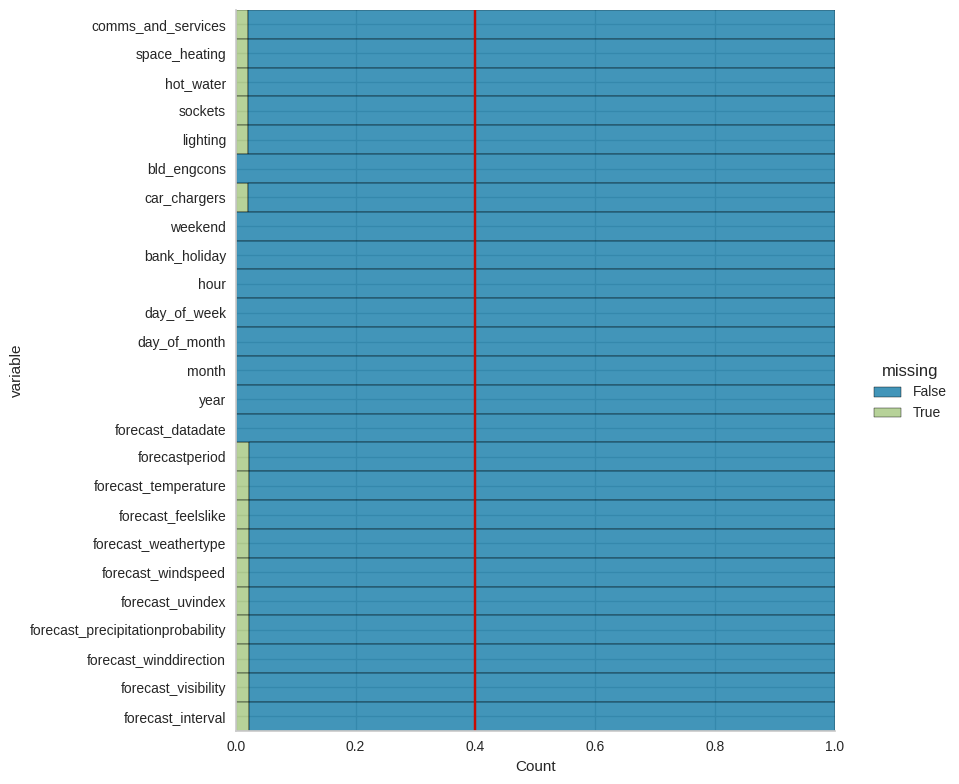

In [ ]:
sns.displot(
    data=data.isna().melt(value_name='missing'),
    y='variable',
    hue='missing',
    multiple='fill',
    height=8,
    aspect=1.1
)

# specifying a threshold value
plt.axvline(0.4, color='r')
plt.show("Na values in the data")

- The mssing data bar chart indicates how much data is missing, general alarming threshold is 40%

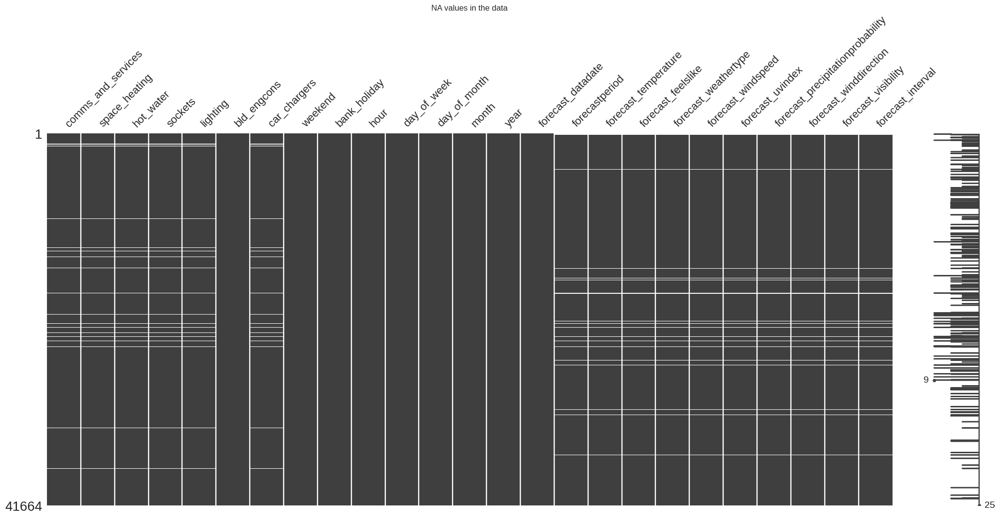

In [ ]:
msno.matrix(data)
plt.title("NA values in the data")
plt.show()

- The missing data chart above represents each sample on y axis and features on x axis, and general distribution per instance how many NA values are present.

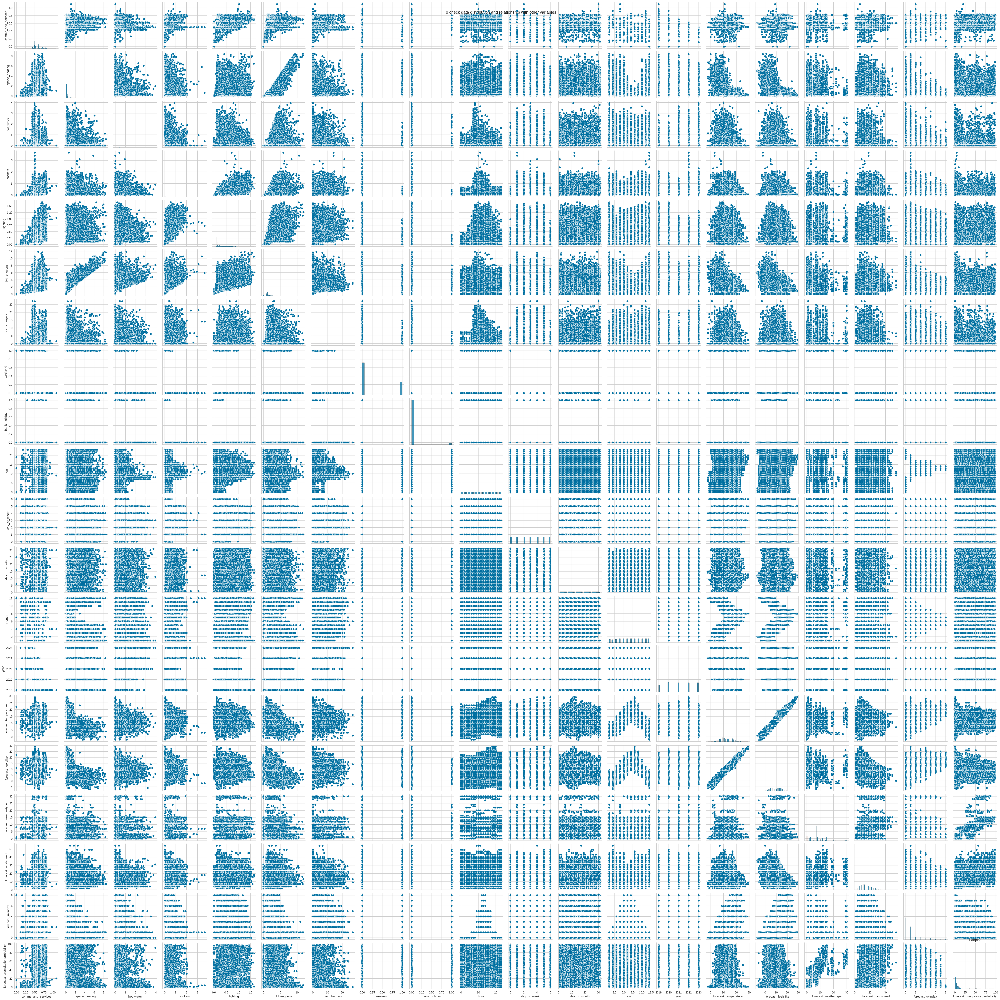

In [ ]:
sns.pairplot(data)
plt.title("Pairplot")
plt.suptitle("To check data distribution and relationship with other variables")
plt.show()

From the above pair plot some patterns we can derive that

    Feature 1       X   feature 2      - type of relationship
    space heating   x   bld_engcons    - linear
    forecast temp   x   space heater   -  exponential decay
    forecastuvindex x   hour           -  bell curve / pyramid / triangle
    forecastuvindex x   month          -  bell curve / pyramid / triangle
    

  




In [ ]:
data.columns

Index(['comms_and_services', 'space_heating', 'hot_water', 'sockets',
       'lighting', 'bld_engcons', 'car_chargers', 'weekend', 'bank_holiday',
       'hour', 'day_of_week', 'day_of_month', 'month', 'year',
       'forecast_datadate', 'forecastperiod', 'forecast_temperature',
       'forecast_feelslike', 'forecast_weathertype', 'forecast_windspeed',
       'forecast_uvindex', 'forecast_precipitationprobability',
       'forecast_winddirection', 'forecast_visibility', 'forecast_interval'],
      dtype='object')

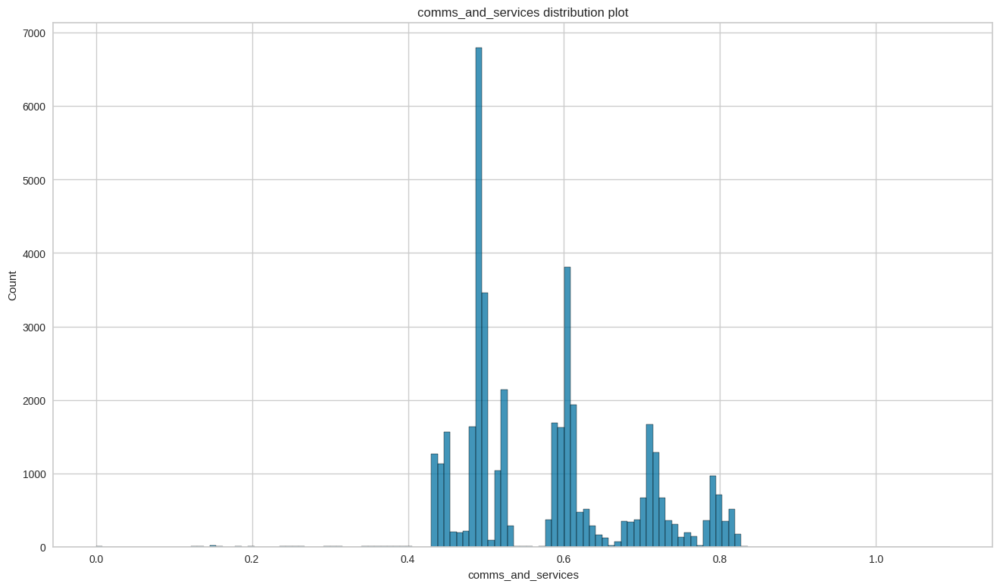

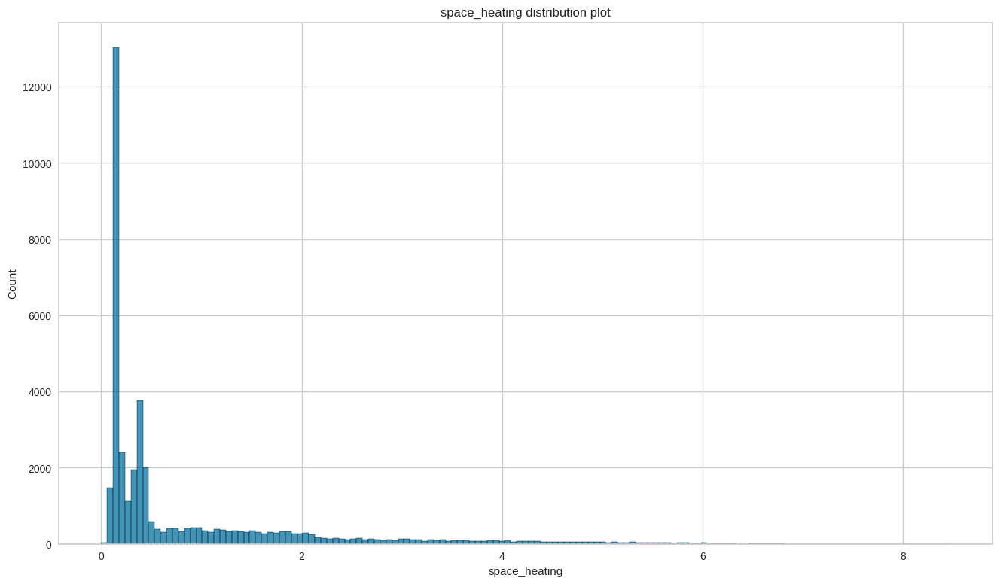

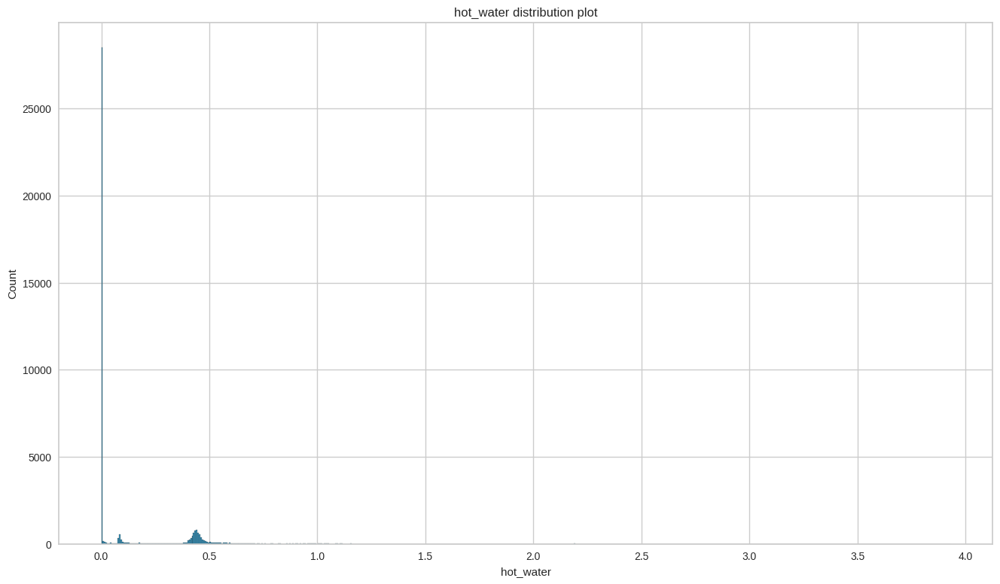

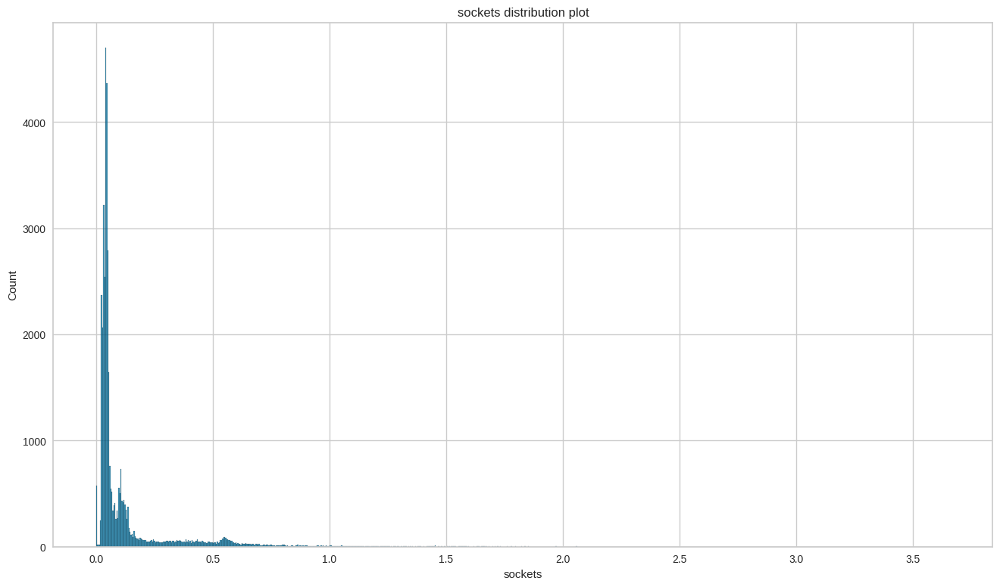

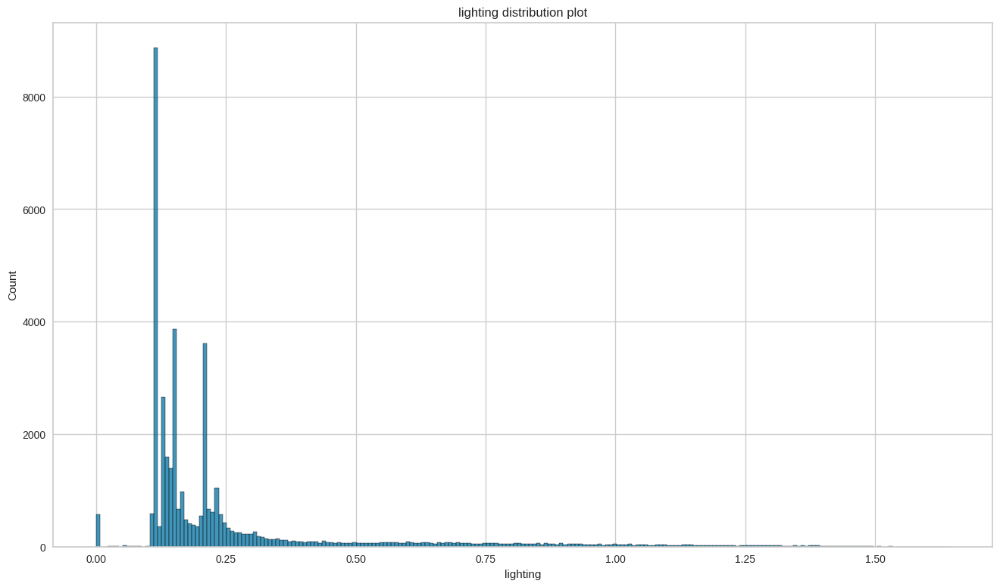

...

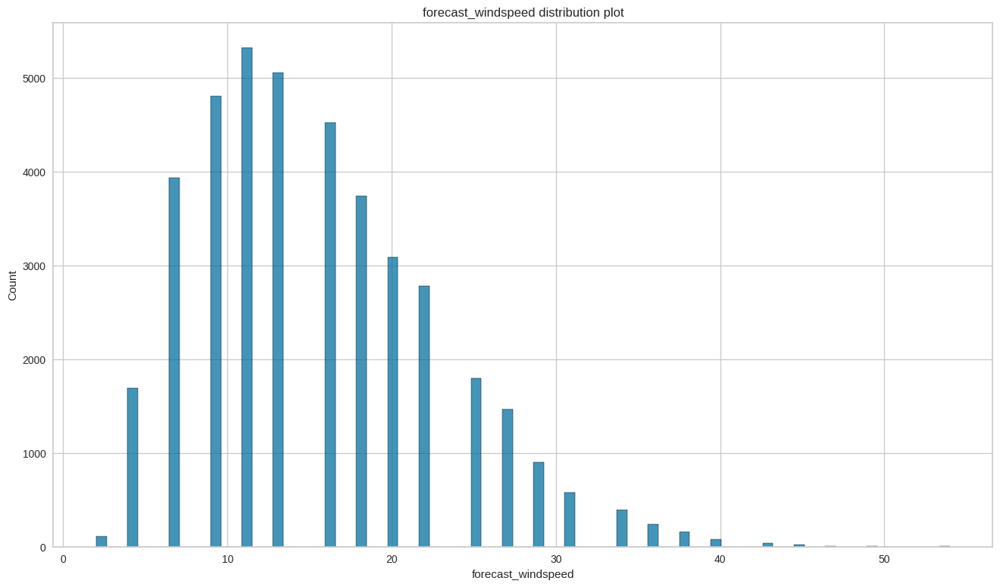

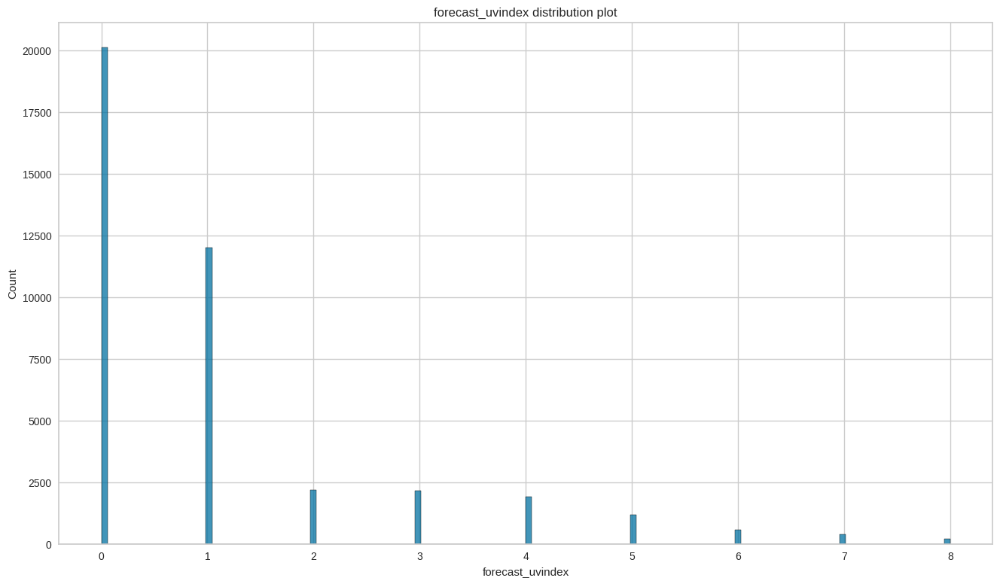

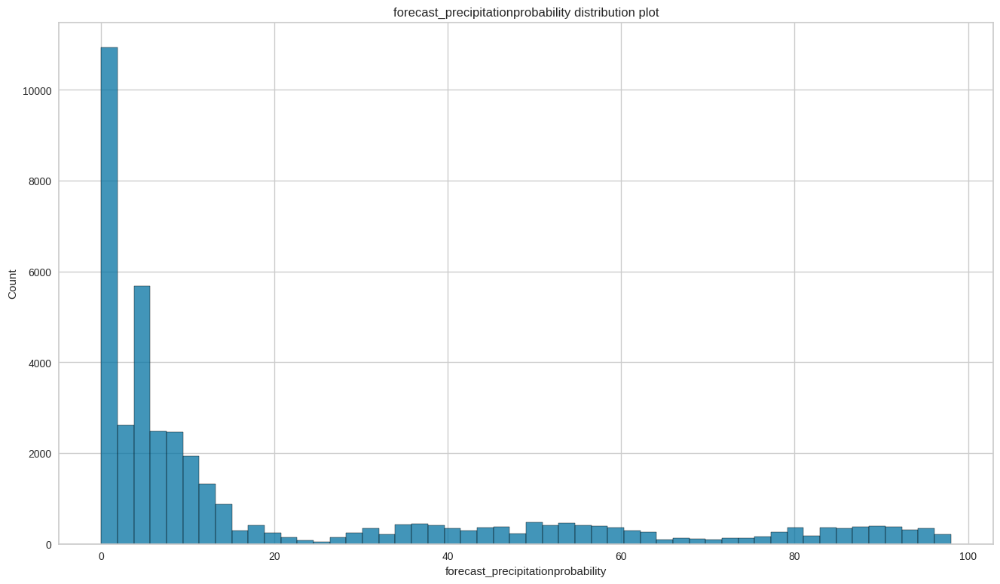

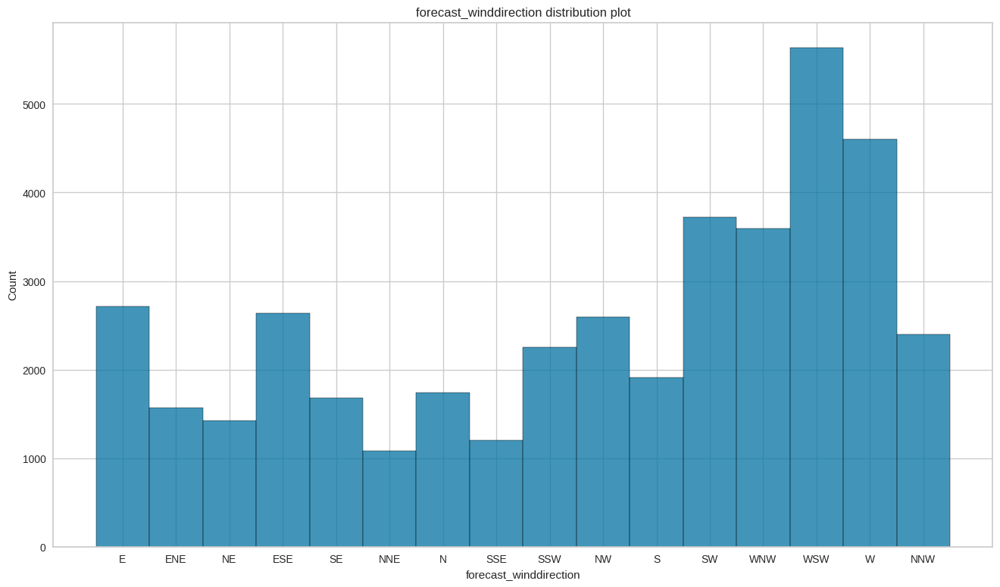

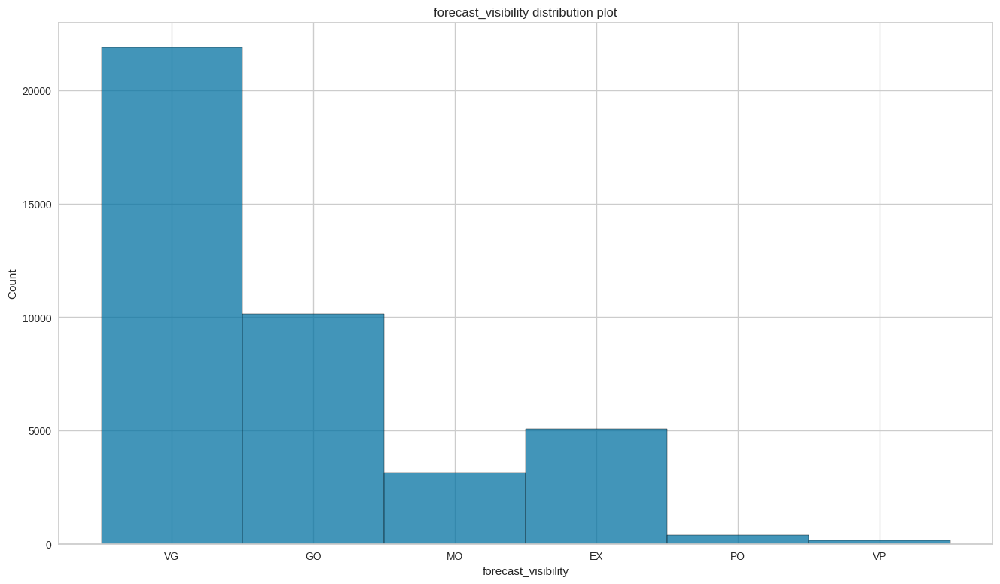

In [ ]:
for col in data.columns:
  if col not in ["forecast_datadate", "forecastperiod", "forecast_interval"]:
    sns.histplot(data[col])
    plt.title(f"{col} distribution plot")
    plt.show()

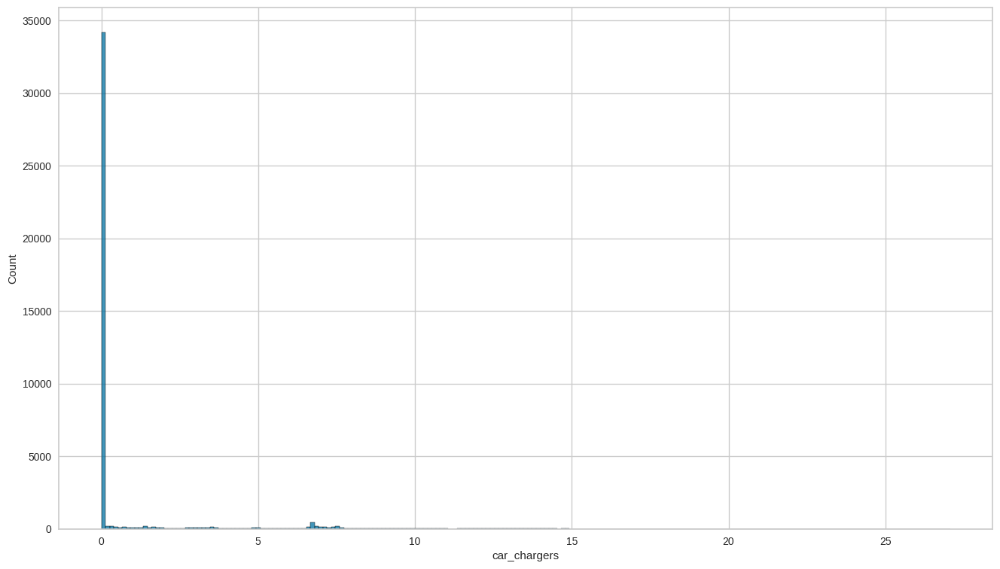

In [ ]:
col = "car_chargers"
sns.histplot(data[col], bins="sqrt")
plt.show()

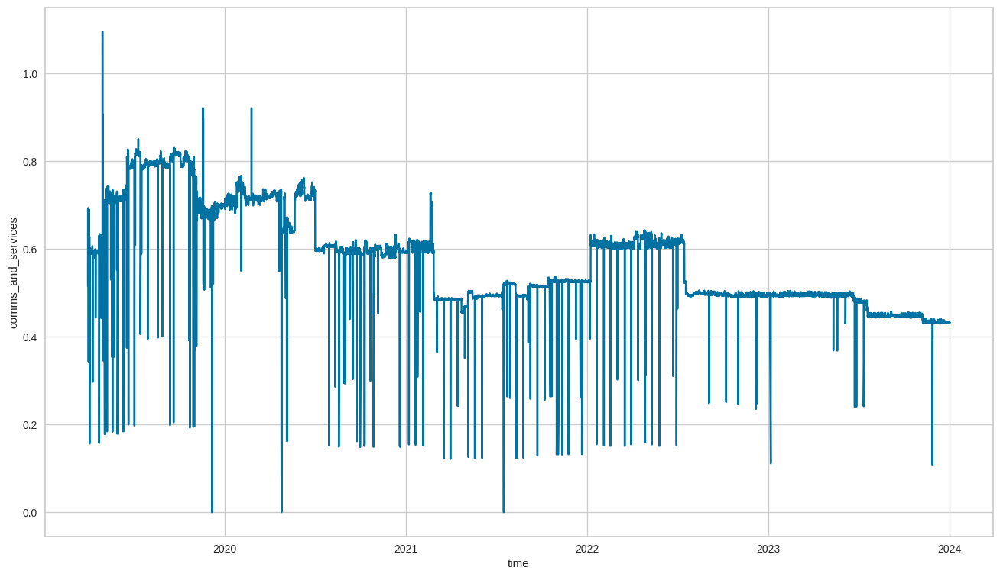

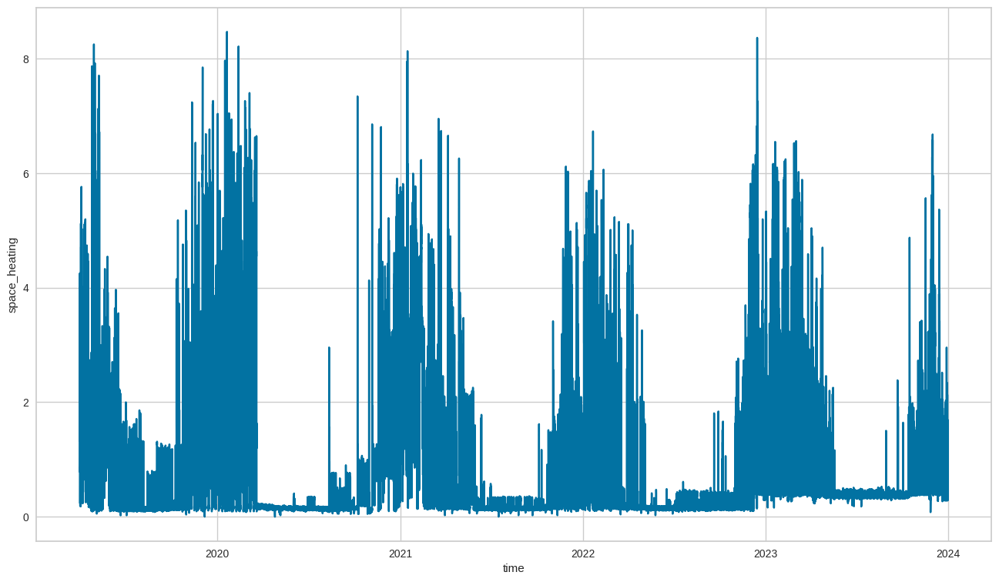

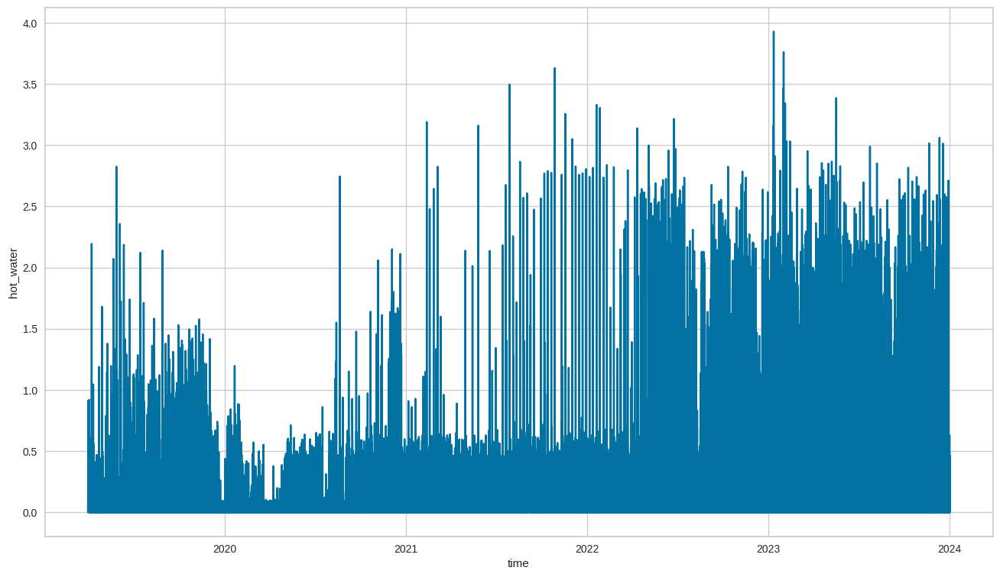

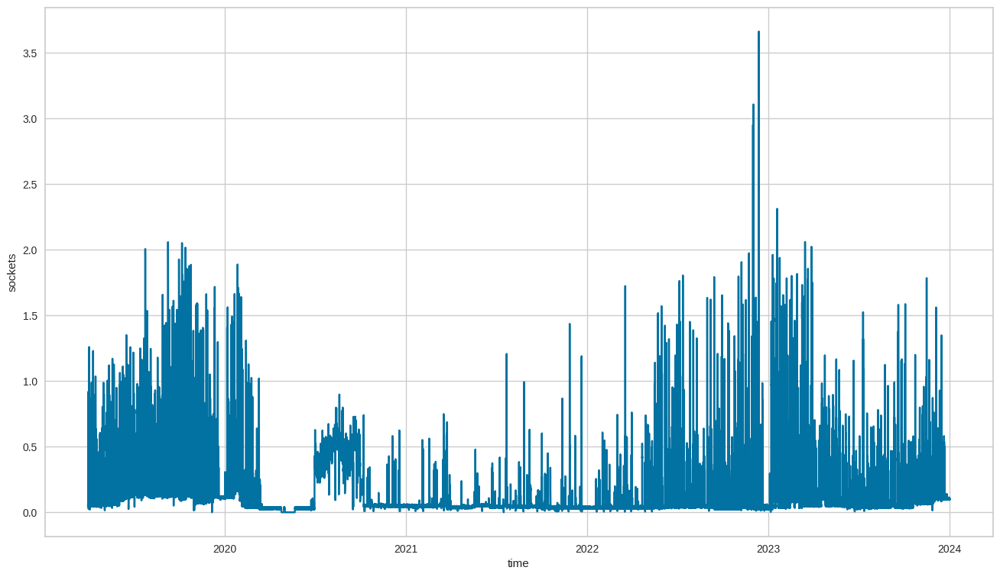

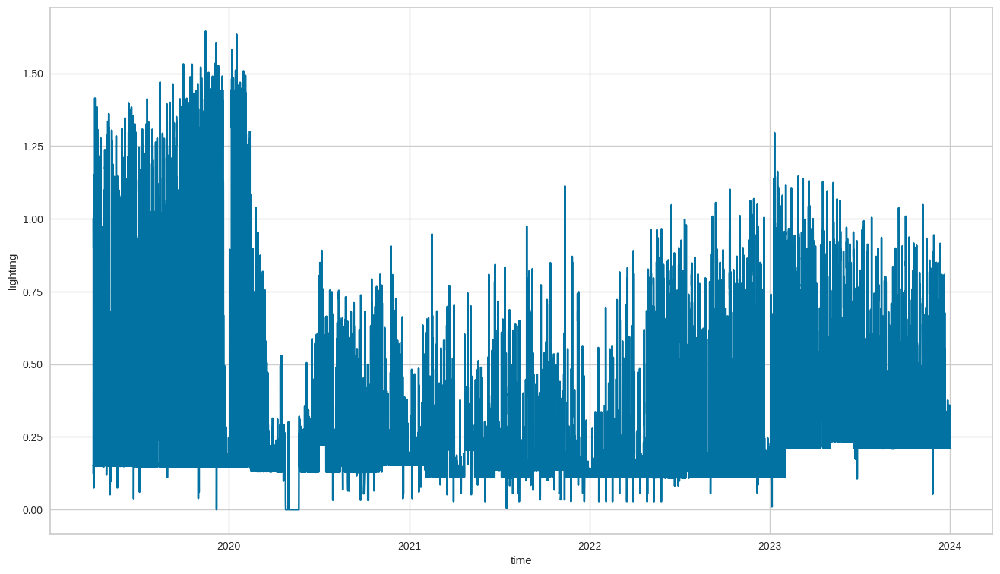

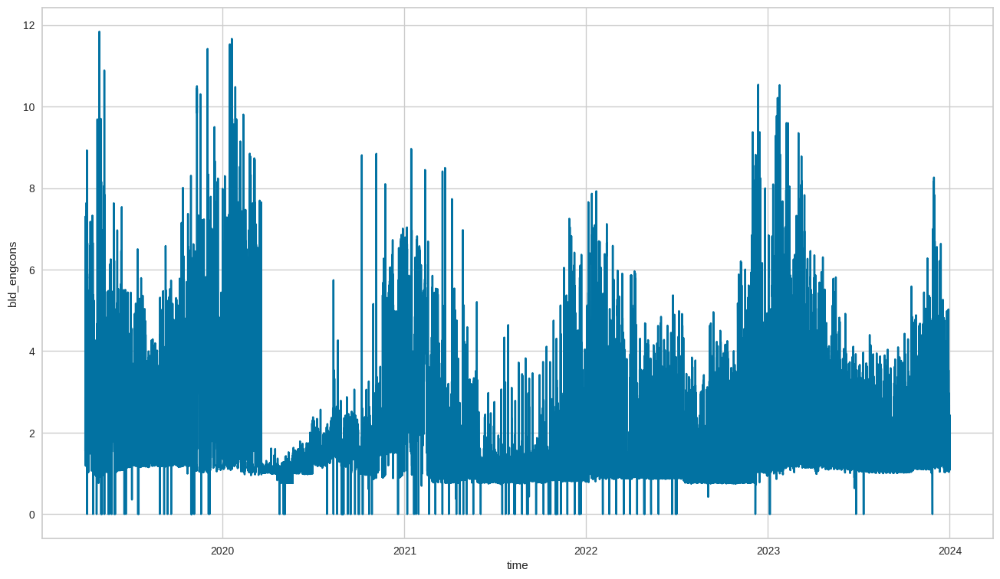

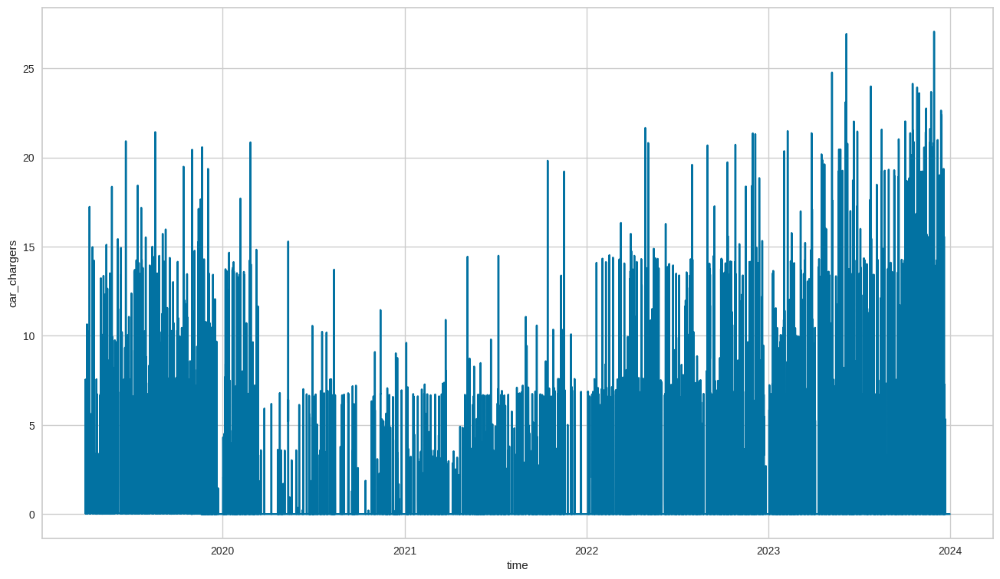

In [ ]:
load_cols = ["comms_and_services", "space_heating", "hot_water", "sockets","lighting", "bld_engcons", "car_chargers"]
for col in load_cols:
  sns.lineplot(data[col])
  plt.show()

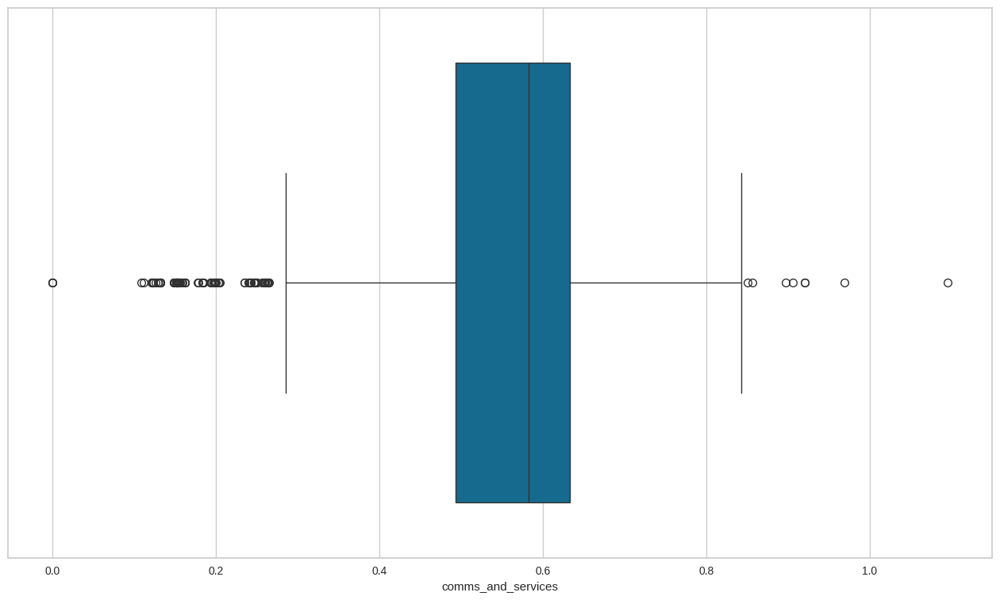

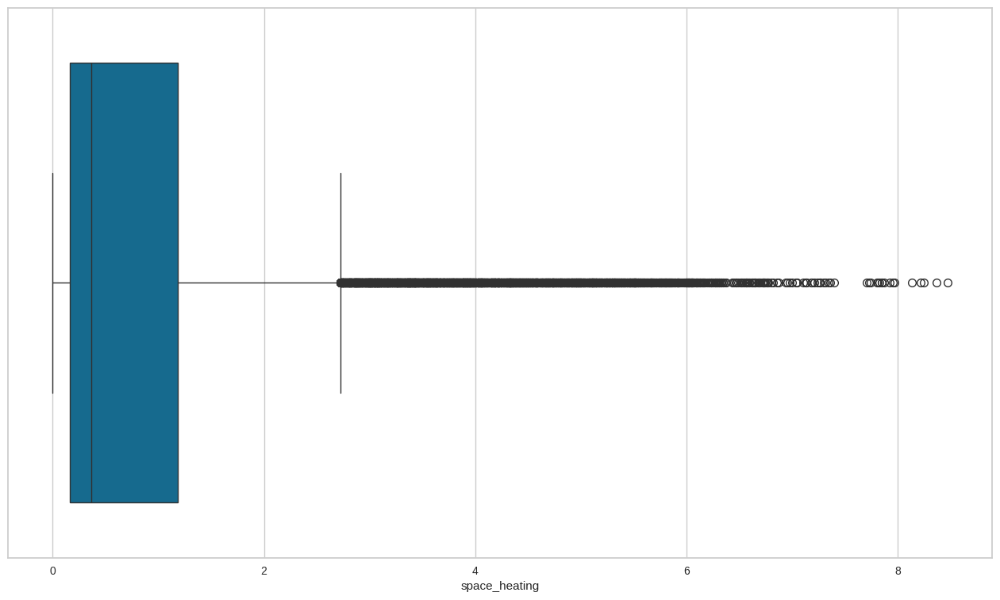

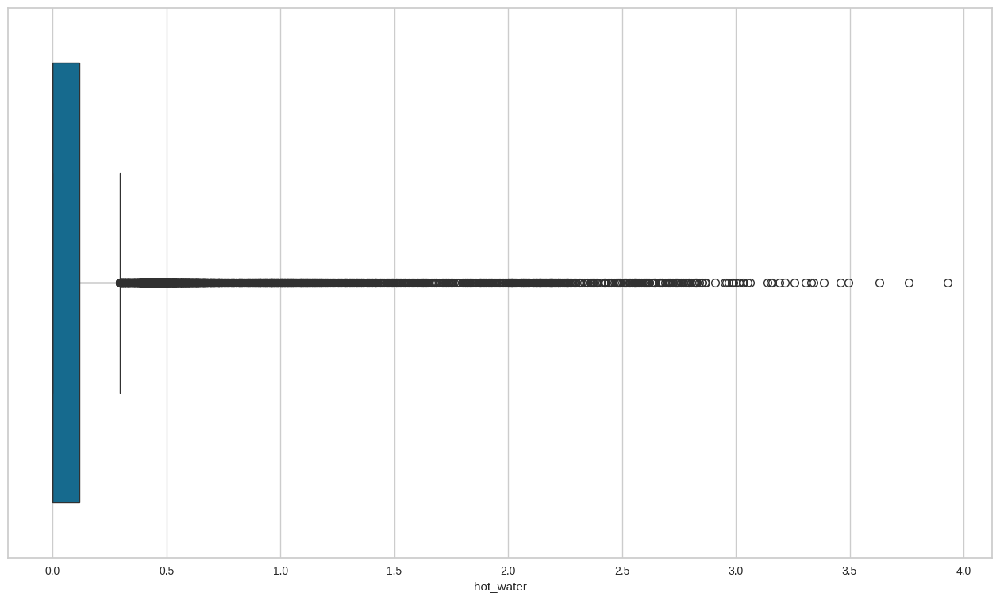

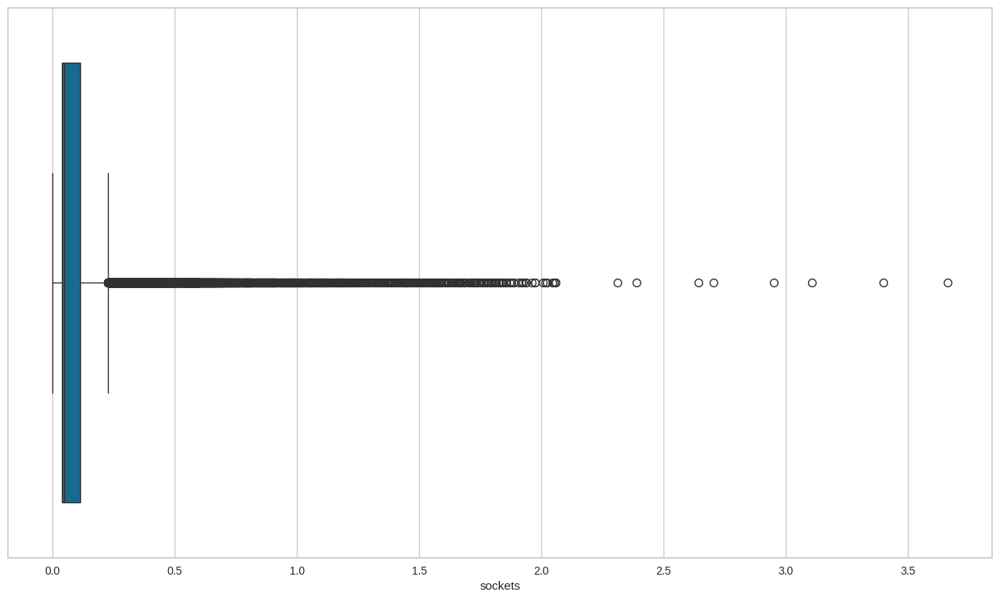

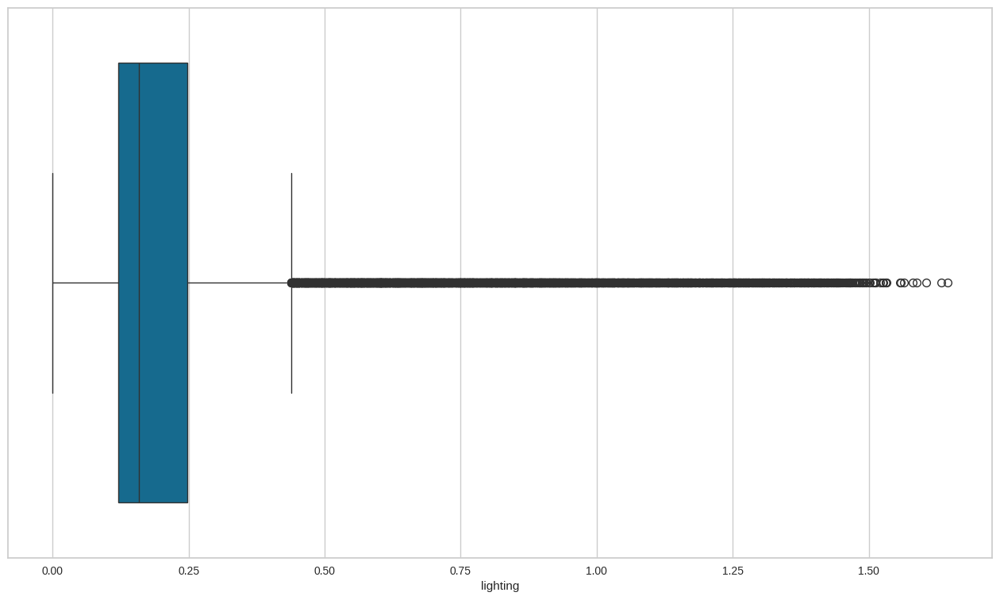

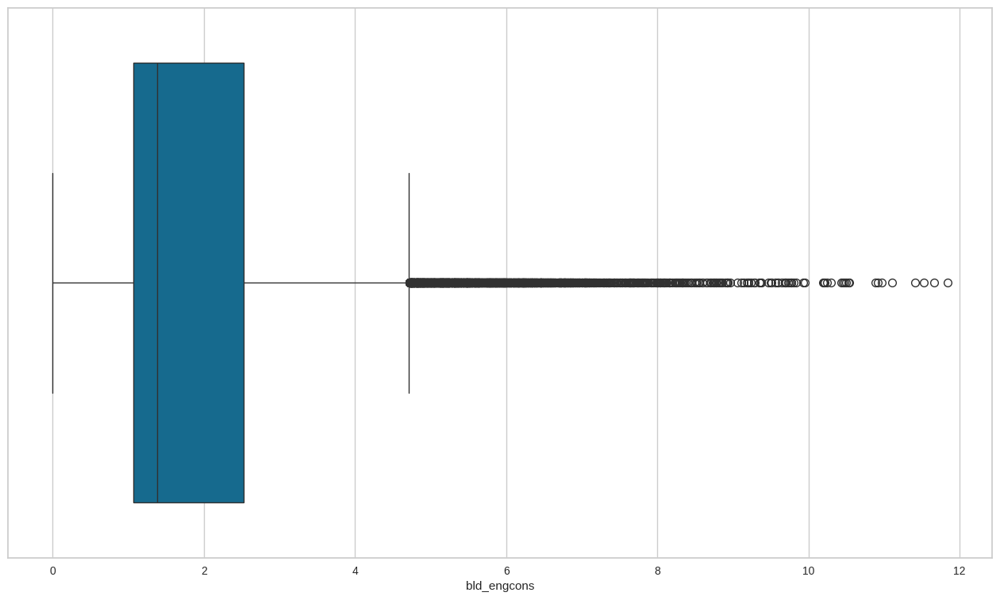

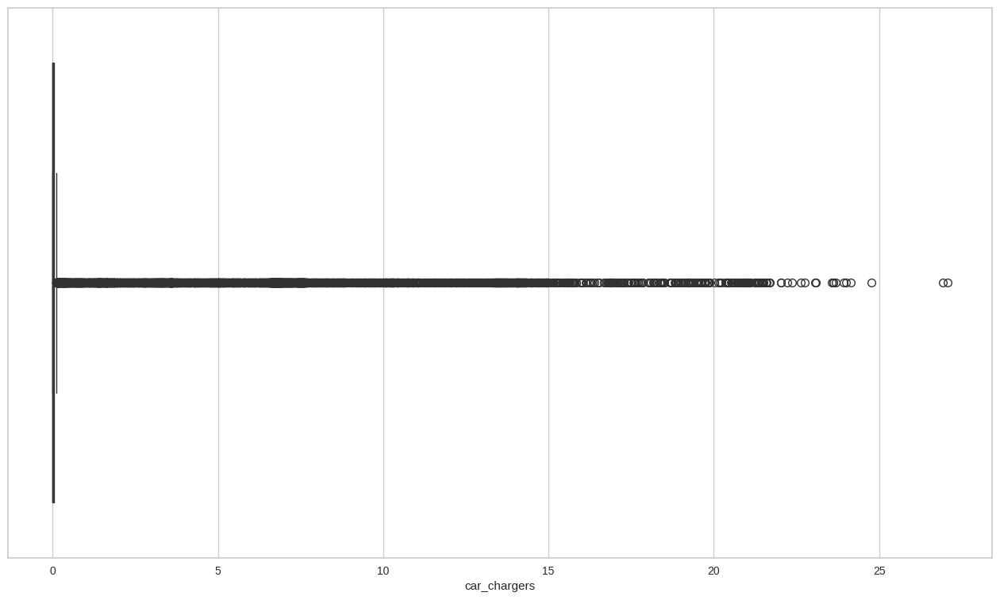

In [ ]:
load_cols = ["comms_and_services", "space_heating", "hot_water", "sockets","lighting", "bld_engcons", "car_chargers"]
for col in load_cols:
  sns.boxplot(x=data[col])
  plt.show()

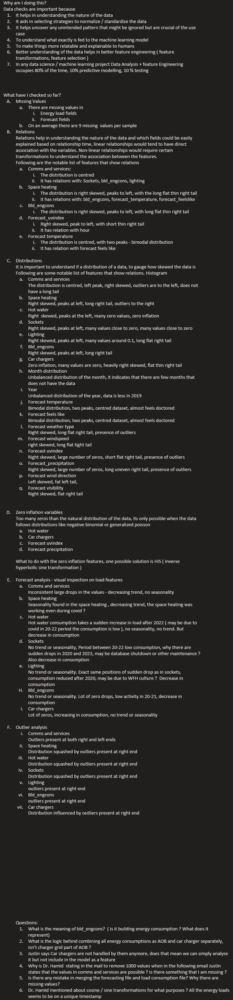